# MultiModal AI For Image & Text For FOOD Dataset 

**By: Karan Salunkhe (21070149016) | Shikhar S Dhoke (21070149021) |  Shubham Londhe (21070149022)**

Importing the Dataset Directly From Kaggle

In [ ]:
!pip install -q kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d gianmarco96/upmcfood101

100% 7.69G/7.70G [00:57<00:00, 155MB/s]
100% 7.70G/7.70G [00:57<00:00, 143MB/s]


In [ ]:
!unzip \*.zip && rm *.zip

Streaming output truncated to the last 5000 lines.
  inflating: images/train/steak/steak_689.jpg  
  inflating: images/train/steak/steak_69.jpg  
  inflating: images/train/steak/steak_690.jpg  
  inflating: images/train/steak/steak_691.jpg  
  inflating: images/train/steak/steak_692.jpg  
  inflating: images/train/steak/steak_694.jpg  
  inflating: images/train/steak/steak_695.jpg  
  inflating: images/train/steak/steak_696.jpg  
  inflating: images/train/steak/steak_70.jpg  
  inflating: images/train/steak/steak_700.jpg  
  inflating: images/train/steak/steak_701.jpg  
  inflating: images/train/steak/steak_702.jpg  
  inflating: images/train/steak/steak_703.jpg  
  inflating: images/train/steak/steak_704.jpg  
  inflating: images/train/steak/steak_705.jpg  
  inflating: images/train/steak/steak_706.jpg  
  inflating: images/train/steak/steak_707.jpg  
  inflating: images/train/steak/steak_708.jpg  
  inflating: images/train/steak/steak_709.jpg  
  inflating: images/train/steak/steak_7

Mounting the Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Installing The Necessary Libraries

In [ ]:
# Install BERT for tf2 module
!pip install bert-for-tf2
# Install Keras version 2.3.1
!pip install keras==2.3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Keras-2.3.1-py2.py3-none-any.whl (377 kB)
  Attempting uninstall: keras
    Found existing installation: keras 2.8.0
    Uninstalling keras-2.8.0:
      Successfully uninstalled keras-2.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0+zzzcolab20220506162203 requires keras<2.9,>=2.8.0rc0, but you have keras 2.3.1 which is incompatible.


In [ ]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached keras-2.8.0-py2.py3-none-any.whl (1.4 MB)
  Attempting uninstall: keras
    Found existing installation: Keras 2.3.1
    Uninstalling Keras-2.3.1:
      Successfully uninstalled Keras-2.3.1


Import all necessary libraries

In [ ]:

try:
    %tensorflow_version 2.x
except Exception:
    pass
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers
from tensorflow.keras import callbacks
from tensorflow.keras import optimizers
from tensorflow.keras import utils
from tensorflow.keras import models
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras import applications
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.regularizers import l2, l1

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix

import bert

import numpy as np 
import pandas as pd
import re
import glob
import os
import cv2
import sys
import pickle

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

Import the training and test .csv files

In [ ]:
colnames=['image_path', 'text', 'food']
train = pd.read_csv('/content/train_titles.csv', names=colnames, header=None, sep = ',', index_col=['image_path'])
test = pd.read_csv('/content/test_titles.csv', names=colnames, header=None, sep = ',', index_col=['image_path'])

Sort values by 'image_path'

In [ ]:
test = test.sort_values('image_path')
train = train.sort_values('image_path')

In [ ]:
print(train.shape)
train.head()

(67972, 2)


,text,food
image_path,,
apple_pie_0.jpg,Apple pie - Wikipedia,apple_pie
apple_pie_100.jpg,Glazed Apple Pie Squares Recipe | Taste of Home,apple_pie
apple_pie_101.jpg,Mock Apple Pie Recipe - Allrecipes.com,apple_pie
apple_pie_102.jpg,Crock-Pot Ladies Crock-Pot Apple Pie Moonshine,apple_pie
apple_pie_104.jpg,All-Star Apple Pie Recipe | Taste of Home,apple_pie


In [ ]:
def get_missing(file, df):
  parts = file.split(os.sep)
  idx = parts[-1]
  cls = parts[-2]
  indexes = df[:,0]
  classes = df[:,2]

  if idx in indexes:
    text = df[idx == indexes][0,1]
    return pd.NA, pd.NA, pd.NA
  else:
    text = df[cls == classes][0,1]
    
  return idx, text, cls   

vec_get_missing = np.vectorize(get_missing, signature='(),(m,n)->(),(),()') 

Creating Function for images loading

In [ ]:
def add_not_found(path, df):
  files = glob.glob(path)
  df = df.reset_index()
  idxs, texts, cls = vec_get_missing(files, df.values)
  
  found = pd.DataFrame({"text": texts,
                        "food": cls,
                       "image_path": idxs})
  na = found.isna().sum().values[0]
  if na<found.shape[0]:
    df = df.append(found)
  df = df.drop_duplicates(subset='image_path', keep='first').dropna()
  df = df.set_index('image_path')
  df = shuffle(df, random_state = 0)
  return df      

Creating Images folders with Train and Test Images

In [ ]:
 train = add_not_found('images/train/*/*.jpg', train)
test = add_not_found('images/test/*/*.jpg', test)

print("Number of training images:",train.shape[0])
print("Number of test images:",test.shape[0])

Number of training images: 67988
Number of test images: 22716


Importing the BERT BASE model from Tensorflow HUB (layer, vocab_file and tokenizer)

In [ ]:
BertTokenizer = bert.bert_tokenization.FullTokenizer
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/1",
                            trainable=False)
vocabulary_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
to_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = BertTokenizer(vocabulary_file, to_lower_case)

Preprocessing of texts and Cleaning of the text

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)
    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)
    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)
    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)
    sentence = sentence.lower()
    return sentence

def remove_tags(text):
    return TAG_RE.sub('', text)

TAG_RE = re.compile(r'<[^>]+>')
vec_preprocess_text = np.vectorize(preprocess_text)

def get_tokens(text, tokenizer):
  tokens = tokenizer.tokenize(text)
  tokens = ["[CLS]"] + tokens + ["[SEP]"]
  length = len(tokens)
  if length > max_length:
      tokens = tokens[:max_length]
  return tokens, length  

def get_masks(text, tokenizer, max_length):
    """Mask for padding"""
    tokens, length = get_tokens(text, tokenizer)
    return np.asarray([1]*len(tokens) + [0] * (max_length - len(tokens)))
vec_get_masks = np.vectorize(get_masks, signature = '(),(),()->(n)')

def get_segments(text, tokenizer, max_length):
    """Segments: 0 for the first sequence, 1 for the second"""
    tokens, length = get_tokens(text, tokenizer)
    segments = []
    current_segment_id = 0
    for token in tokens:
        segments.append(current_segment_id)
        if token == "[SEP]":
            current_segment_id = 1
    return np.asarray(segments + [0] * (max_length - len(tokens)))
vec_get_segments = np.vectorize(get_segments, signature = '(),(),()->(n)')

def get_ids(text, tokenizer, max_length):
    """Token ids from Tokenizer vocab"""
    tokens, length = get_tokens(text, tokenizer)
    token_ids = tokenizer.convert_tokens_to_ids(tokens)
    input_ids = np.asarray(token_ids + [0] * (max_length-length))
    return input_ids
vec_get_ids = np.vectorize(get_ids, signature = '(),(),()->(n)')

def get_texts(path):
    path = path.decode('utf-8')
    parts = path.split(os.sep)
    image_name = parts[-1]
    is_train = parts[-3] == 'train'
    if is_train:
      df = train
    else:
      df = test

    text = df['text'][image_name]
    return text
vec_get_text = np.vectorize(get_texts)
def prepare_text(paths):
    #Preparing texts
    
    texts = vec_get_text(paths)
    
    text_array = vec_preprocess_text(texts)
    ids = vec_get_ids(text_array, 
                      tokenizer, 
                      max_length).squeeze().astype(np.int32)
    masks = vec_get_masks(text_array,
                          tokenizer,
                          max_length).squeeze().astype(np.int32)
    segments = vec_get_segments(text_array,
                                tokenizer,
                                max_length).squeeze().astype(np.int32)
    
    return ids, segments, masks

def clean(i, tokens):
  try:
    this_token = tokens[i]
    next_token = tokens[i+1]
  except:
    return tokens
  if '##' in next_token:
      tokens.remove(next_token)
      tokens[i] = this_token + next_token[2:]
      tokens = clean(i, tokens)
      return tokens
  else:
    i = i+1
    tokens = clean(i, tokens)
    return tokens

def clean_text(array):
  array = array[(array!=0) & (array != 101) & (array != 102)]
  tokens = tokenizer.convert_ids_to_tokens(array)
  tokens = clean(0, tokens)
  text = ' '.join(tokens)
  return text

In [ ]:
# Images preprocessing
def load_image(path):
    path = path.decode('utf-8')
    image = cv2.imread(path)
    image = cv2.resize(image, (img_width, img_height))
    image = image/255
    image = image.astype(np.float32)
    parts = path.split(os.sep)
    labels = parts[-2] == Classes 
    labels = labels.astype(np.int32)
    
    return image, labels
    
vec_load_image = np.vectorize(load_image, signature = '()->(r,c,d),(s)')

Dataset creation from the clean text

In [ ]:
def prepare_data(paths):
    #Images and labels
    images, labels = tf.numpy_function(vec_load_image, 
                                      [paths], 
                                      [tf.float32, 
                                        tf.int32])
    
    
    [ids, segments, masks, ] = tf.numpy_function(prepare_text, 
                                              [paths], 
                                              [tf.int32, 
                                               tf.int32,
                                               tf.int32])
    images.set_shape([None, img_width, img_height, depth])
    labels.set_shape([None, nClasses])
    ids.set_shape([None, max_length])
    masks.set_shape([None, max_length])
    segments.set_shape([None, max_length])
    return ({"input_word_ids": ids, 
             "input_mask": masks,  
             "segment_ids": segments, 
             "image": images},
            {"class": labels})
    

    return dataset

Parameters setting: images width and height, depth, number if classes, input shape 

In [ ]:
batch_size =  80
img_width = 299
img_height = 299
depth = 3
max_length = 20 #Setup according to the text

nClasses = train.food.nunique()
Classes = train.food.unique()
input_shape = (img_width, img_height, depth)

In [ ]:
# Images loading using tf.data
def tf_data(path, batch_size):
    paths = tf.data.Dataset.list_files(path)
    paths = paths.batch(64)
    dataset = paths.map(prepare_data, tf.data.experimental.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    dataset = dataset.unbatch()
    dataset = dataset.batch(batch_size)
    dataset = dataset.repeat()
    return dataset   
data_train = tf_data('images/train/*/*.jpg', batch_size)
data_test = tf_data('images/test/*/*.jpg', batch_size)

Plot some samples of images with related text

In [ ]:
ip, op = next(iter(data_train))
images = ip['image'][:16]
input_word_ids = ip['input_word_ids'][:16]
true_labels =  op['class'][:16]

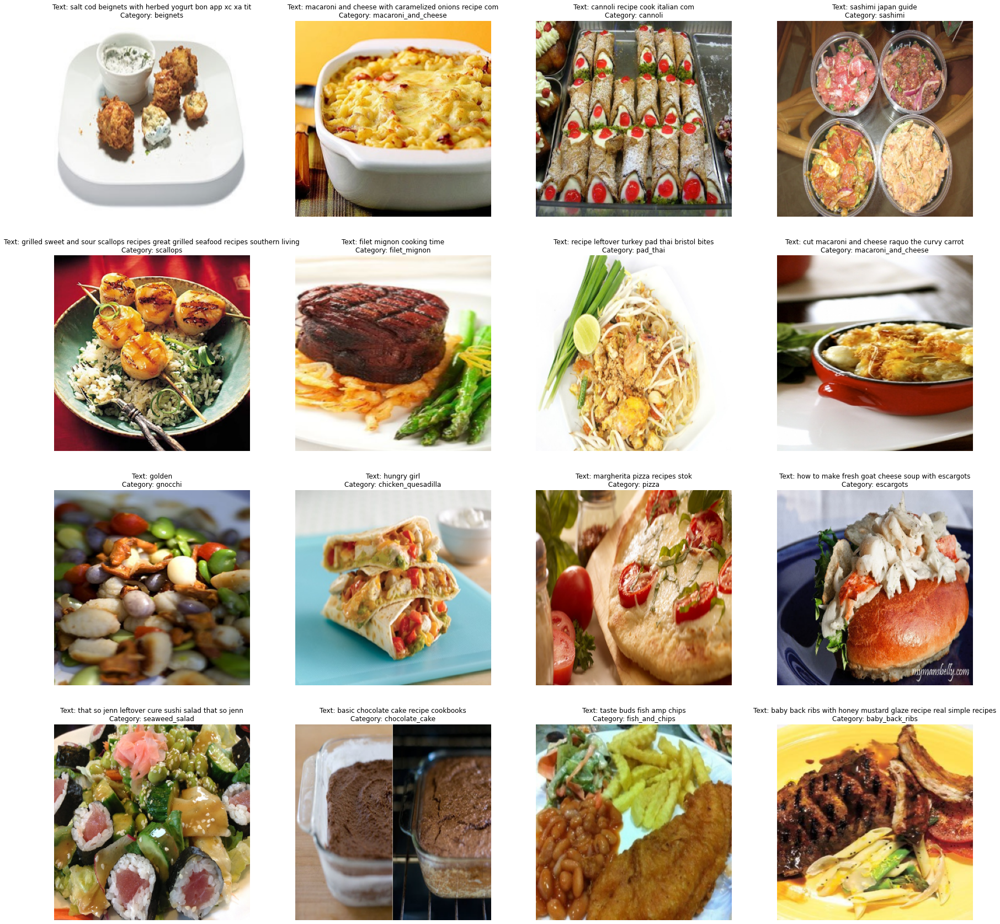

In [ ]:
# Print images and related texts before classification
i=1
texts = [clean_text(array) for array in input_word_ids.numpy()]
plt.figure(figsize=(30,30))
for image, label, text in zip(images.numpy(), true_labels.numpy(), texts):
      plt.subplot(4,4,i)
      i+=1
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.imshow(image)
      plt.axis('off')
      plt.title("Text: {}\nCategory: {}".format(text, Classes[label.argmax(0)]))
plt.show()

Classification Model

In [ ]:
# Images Model
model_cnn = models.Sequential()
model_cnn.add(InceptionV3(weights='imagenet', include_top=False, input_tensor=layers.Input(shape=(299, 299, 3))))
model_cnn.add(layers.AveragePooling2D(pool_size=(8, 8), name='AVG_Pooling'))
model_cnn.add(layers.Dropout(.4, name='Dropout_0.4'))
model_cnn.add(layers.Flatten(name='Flatten'))
model_cnn.add(layers.Dense(128, name='Dense_128'))

87924736/87910968 [==============================] - 0s 0us/step


In [ ]:
# Keep model layers trainable
for layer in model_cnn.layers:
    layer.trainable = True

#-----------------------SUMMARY IMAGES MODEL--------------------------------------------------------------#

In [ ]:
model_cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 AVG_Pooling (AveragePooling  (None, 1, 1, 2048)       0         
 2D)                                                             
                                                                 
 Dropout_0.4 (Dropout)       (None, 1, 1, 2048)        0         
                                                                 
 Flatten (Flatten)           (None, 2048)              0         
                                                                 
 Dense_128 (Dense)           (None, 128)               262272    
                                                                 
Total params: 22,065,056
Trainable params: 22,030,624
Non-trainable params: 34,432
_______________________________________

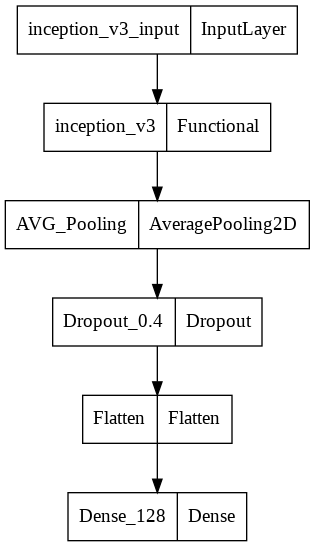

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_cnn, to_file='model_cnn.png')

In [ ]:
# Bert + LSTM text model
input_ids = layers.Input(shape=(max_length,), dtype=tf.int32, name="input_word_ids")
input_masks = layers.Input(shape=(max_length,), dtype=tf.int32, name="input_masks")
input_segments = layers.Input(shape=(max_length,), dtype=tf.int32, name="segment_ids")
_, seq_out = bert_layer([input_ids, input_masks, input_segments])
out = layers.LSTM(128, name='LSTM')(seq_out)
model_lstm = models.Model([input_ids, input_masks, input_segments], out)

In [ ]:
# Keep the Bert + LSTM layers trainable
for layer in model_lstm.layers:
    layer.trainable = True

#-----------------------SUMMARY TEXT MODEL--------------------------------------------------------------#

In [ ]:
model_lstm.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_word_ids (InputLayer)    [(None, 20)]         0           []                               
                                                                                                  
 input_masks (InputLayer)       [(None, 20)]         0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 20)]         0           []                               
                                                                                                  
 keras_layer (KerasLayer)       [(None, 768),        109482241   ['input_word_ids[0][0]',         
                                 (None, 20, 768)]                 'input_masks[0][0]',        

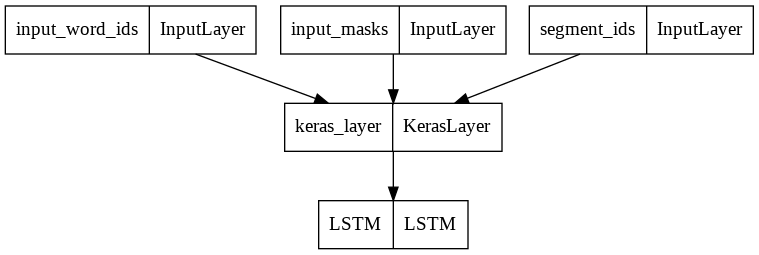

In [ ]:
plot_model(model_lstm, to_file='bert_lstm.png')

In [ ]:
# Stacking early-fusion multimodal model

input_word_ids = layers.Input(shape=(max_length,), dtype=tf.int32,
                                       name="input_word_ids")
input_mask = layers.Input(shape=(max_length,), dtype=tf.int32,
                                   name="input_mask")
segment_ids = layers.Input(shape=(max_length,), dtype=tf.int32,
                                    name="segment_ids")
image_input = layers.Input(shape = input_shape, dtype=tf.float32,
                           name = "image")

image_side = model_cnn(image_input)
text_side = model_lstm([input_word_ids, input_mask, segment_ids])
# Concatenate features from images and texts
merged = layers.Concatenate()([image_side, text_side])
merged = layers.Dense(256, activation = 'relu')(merged)
output = layers.Dense(nClasses, activation='softmax', name = "class")(merged)

In [ ]:
model = models.Model([input_word_ids, input_mask, segment_ids, image_input], output)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_word_ids (InputLayer)    [(None, 20)]         0           []                               
                                                                                                  
 input_mask (InputLayer)        [(None, 20)]         0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 20)]         0           []                         

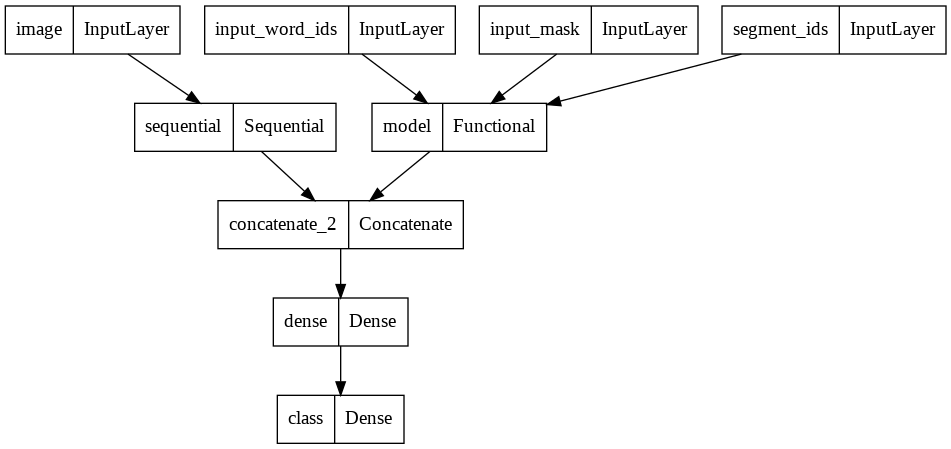

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='multimodal.png')

In [ ]:
# Stochastic Gradient Descent optimizer
sgd = optimizers.SGD(learning_rate=0.0001, momentum=0.9, nesterov=False)

# Compile model
model.compile(loss='categorical_crossentropy', 
              optimizer=sgd, 
              metrics=['accuracy'])

In [ ]:
# Setup callbacks, logs and early stopping condition
checkpoint_path = "stacking_early_fusion/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
cp = callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy',save_best_only=True,verbose=1, mode='max')
csv_logger = callbacks.CSVLogger('stacking_early_fusion/stacking_early.log')
es = callbacks.EarlyStopping(patience = 3, restore_best_weights=True)

In [ ]:
# Reduce learning rate if no improvement is observed
reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_accuracy', factor=0.1, patience=1, min_lr=0.00001)

In [ ]:
# Training
model.fit(data_train,
                   epochs=15,
                   steps_per_epoch = train.shape[0]//batch_size,
                    validation_data = data_test,
                    validation_steps = test.shape[0]//batch_size,
                    callbacks=[cp, csv_logger, reduce_lr])

Epoch 1/15
849/849 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 0.9978
Epoch 1: val_accuracy improved from -inf to 0.92491, saving model to stacking_early_fusion/weights-improvement-01-0.92.hdf5
849/849 [==============================] - 1603s 2s/step - loss: 0.0044 - accuracy: 0.9978 - val_loss: 0.4525 - val_accuracy: 0.9249 - lr: 1.0000e-04
Epoch 2/15
849/849 [==============================] - ETA: 0s - loss: 0.0042 - accuracy: 0.9980
Epoch 2: val_accuracy did not improve from 0.92491
849/849 [==============================] - 1584s 2s/step - loss: 0.0042 - accuracy: 0.9980 - val_loss: 0.4514 - val_accuracy: 0.9248 - lr: 1.0000e-04
Epoch 3/15
849/849 [==============================] - ETA: 0s - loss: 0.0043 - accuracy: 0.9978
Epoch 3: val_accuracy did not improve from 0.92491
849/849 [==============================] - 1562s 2s/step - loss: 0.0043 - accuracy: 0.9978 - val_loss: 0.4523 - val_accuracy: 0.9246 - lr: 1.0000e-05
Epoch 4/15
849/849 [================

In [ ]:
model.load_weights('/content/drive/MyDrive/Flexi_Project/early_fusion_weights_0.92.hdf5')

In [ ]:
# Model evaluation on test set
model.evaluate(data_test,
               steps = test.shape[0]//batch_size)

283/283 [==============================] - 240s 777ms/step - loss: 0.4512 - accuracy: 0.9250


[0.4512225091457367, 0.9249558448791504]

Plot some predictions

In [ ]:
ip, op = next(iter(data_test))
images = ip['image'][:16]

input_masks = ip['input_mask'][:16]
input_word_ids = ip['input_word_ids'][:16]
input_segments = ip['segment_ids'][:16]

true_labels =  op['class'][:16]

In [ ]:
pred_labels = model.predict([input_word_ids,
                             input_masks,
                             input_segments,
                             images])

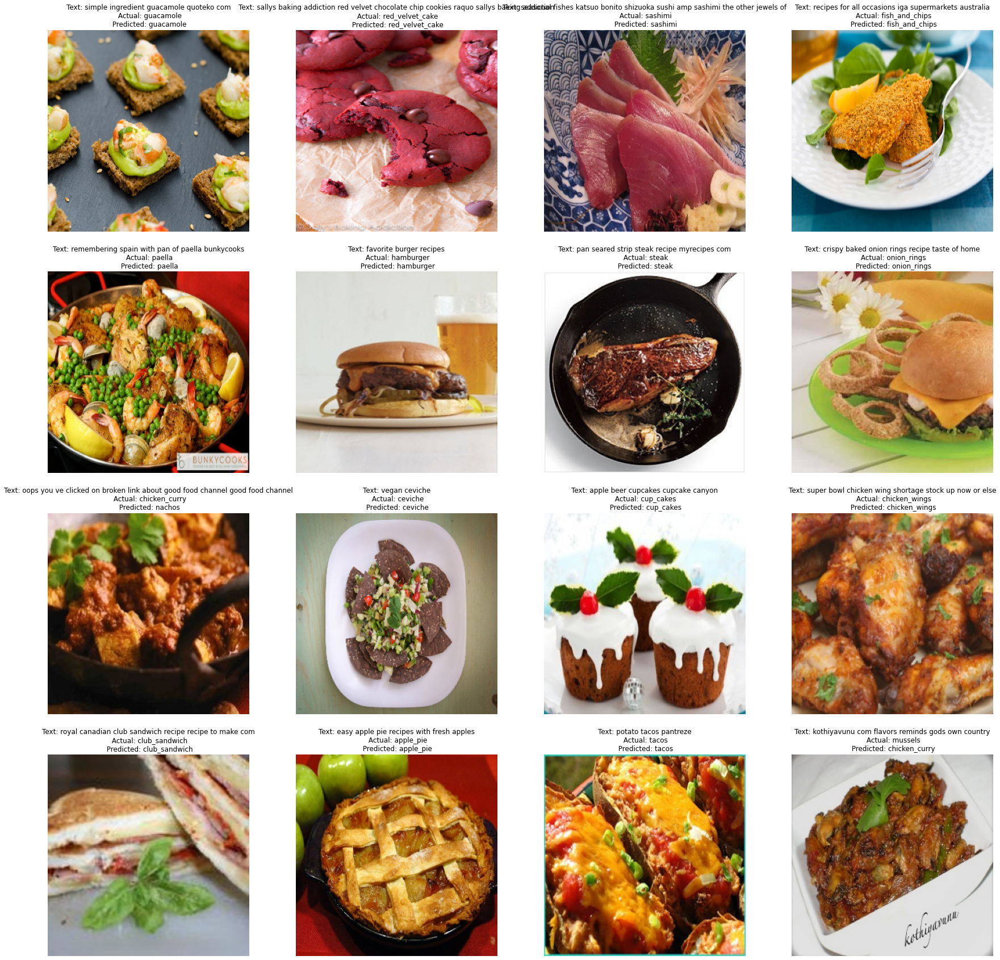

In [ ]:
i=1
texts = [clean_text(array) for array in input_word_ids.numpy()[:16]]
plt.figure(figsize=(30,30))
for image, actual_label, label, text in zip(images.numpy()[:16], true_labels.numpy()[:16], pred_labels, texts):
      plt.subplot(4,4,i)
      i+=1
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.imshow(image)
      plt.axis('off')
      plt.title("Text: {}\n Actual: {}\n Predicted: {}".format(text, Classes[actual_label.argmax(0)], Classes[label.argmax(0)]))
      plt.xlabel(text)
plt.show()

Thankyou.